# Assignment-w9-TextMining-GROUP ASSIGNMENT

## 1. Project Overview and Dataset Summary

### 1.1 Introduction

Social media platforms have become integral to modern communication, connecting people globally but also creating challenges in managing harmful or offensive content. As the volume of user-generated content grows, the need for automated content moderation systems is essential to maintain a safe and inclusive environment. This project focuses on developing a machine learning model capable of classifying tweets into categories such as hate speech, offensive language, and neutral content. Such classification models help social media platforms manage content responsibly, supporting efforts to foster positive user interactions while limiting the spread of harmful language.

### 1.2 Problem Statement

The problem of accurately identifying and classifying text data as hate speech, offensive language, or neutral content is complex. Classifying language misuse is challenging because certain terms can be harmful in one context but neutral in another. An effective model must handle these nuances, balancing sensitivity in detection without misclassifying innocuous content, which can lead to over-censorship or the perpetuation of harmful language online. This project’s goal is to create a reliable and efficient model that enables real-time content moderation, enhancing both platform integrity and user safety.

### 1.3 Dataset Identification

The dataset consists of 24,783 labeled tweets, providing a rich source of real-world data for training and evaluating text classification models. Each tweet is assigned a label based on its language content:

- **Hate Speech**: Tweets that contain hate speech.
- **Offensive Language**: Tweets that include offensive language but do not explicitly qualify as hate speech.
- **Neutral Content**: Tweets that are classified as neither hate speech nor offensive.
  
### Key dataset variables include:

- **count**: Total number of classifications given to each tweet by human reviewers.
- **hate_speech, offensive_language, neither**: Number of votes each tweet received for each category, reflecting reviewers' perceptions.
- **class**: Final classification label (0 = hate speech, 1 = offensive language, 2 = neutral).
- **tweet**: The text content of the tweet itself, which is the main feature to be analyzed and classified.

## 2. Data Preprocessing :

To prepare the tweets for accurate classification, a series of preprocessing steps were taken to clean and structure the text data, making it suitable for machine learning. Each step ensures that the data is in its simplest, most relevant form for model training.


### 2.1  Importing Libraries and Initializing Resources

We start by importing the essential libraries for text preprocessing, including re for regular expressions and nltk for natural language processing. The lemmatizer and stop words are initialized to be used in the preprocessing function. Downloading the NLTK data ensures access to language resources like stop words and the WordNet lemmatizer.

In [1]:
!pip install nltk


In [2]:
!pip install xgboost


In [3]:
# Import library
import re
# Data manipulation and visualization
import pandas as pd
import numpy as np
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Scikit-learn imports
from sklearn import preprocessing
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import nltk
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,precision_score,recall_score

# Machine learning models
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression            
from sklearn.neighbors import KNeighborsClassifier             
from sklearn.svm import SVC                                    
from sklearn.tree import DecisionTreeClassifier                
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
# XGBoost

from xgboost import XGBClassifier   

# MLflow imports
import mlflow
import mlflow.sklearn
from mlflow.tracking import MlflowClient
from mlflow.entities import ViewType

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# For handling requests
import requests

# For JSON handling
import json

# Download necessary NLTK data
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/pranaytalluri/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/pranaytalluri/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
data = pd.read_csv("/Users/pranaytalluri/Downloads/labeled_data 3.csv")

In [5]:
data.head(5)

,Unnamed: 0,count,hate_speech,offensive_language,neither,class,tweet
0,0,3,0,0,3,2,!!! RT @mayasolovely: As a woman you shouldn't...
1,1,3,0,3,0,1,!!!!! RT @mleew17: boy dats cold...tyga dwn ba...
2,2,3,0,3,0,1,!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby...
3,3,3,0,2,1,1,!!!!!!!!! RT @C_G_Anderson: @viva_based she lo...
4,4,6,0,6,0,1,!!!!!!!!!!!!! RT @ShenikaRoberts: The shit you...


In [6]:
data[['tweet']].isna().sum()

tweet    0
dtype: int64

### 2.2 Lemmatization and Preprocessing Text Function

In [7]:
# Initialize lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

#### We create the function that processes each tweet as follows:

- **Convert to lowercase:** Standardizes text to lowercase, so variations like “Hate” and “hate” are treated the same.
- **Remove URLs:** Deletes links to eliminate irrelevant information.
- **Remove mentions (e.g., @username) and retweet indicators (RT):** Cleans up the text by removing references to other users and retweet markers.
- **Remove special characters and numbers:** Filters out symbols and numbers, focusing on alphabetic content.
- **Tokenization, Stop-Word Removal, and Lemmatization:**
     - Splits text into individual words (tokens).
     - Removes stop words (e.g., “the,” “is”) to reduce noise.
     - Lemmatization: Converts each word to its base form (e.g., “running” becomes “run”), reducing vocabulary size by consolidating variations and focusing on word roots, which preserves core meaning.


In [8]:
def preprocess_text(text):
    if not isinstance(text, str):
        return ""
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    
    # Remove RT and @username
    text = re.sub(r'\brt\b', '', text)
    text = re.sub(r'@\w+', '', text)
    
    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    
    # Tokenize, remove stopwords and lemmatize
    tokens = [lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words]
    
    return ' '.join(tokens)

### 2.3  Applying the Preprocessing Function

In this step, we apply the preprocess_text function to each tweet, storing the cleaned text back in the X variable. This ensures that all tweets are preprocessed uniformly, transforming raw text into a standardized format that’s ready for feature extraction and model training.

In [9]:
X = data['tweet']
y = data['class']

In [10]:
# Display unique classes
print("Unique classes:", y.unique())

Unique classes: [2 1 0]


In [11]:
# Preprocess the text
X = X.apply(preprocess_text)

In [12]:
from IPython.display import display, HTML

# Convert tweets to HTML format for better display
tweets_html = "".join(f"<p>{i+1}: {tweet}</p>" for i, tweet in enumerate(X))
display(HTML(f"<div style='height: 300px; overflow-y: scroll;'>{tweets_html}</div>"))

### 2.4 Preparing Data for Model Training

#### 2.4.1 Splitting the Data into Training and Testing Sets

This section deals the steps taken to prepare the text data for model training, ensuring it is structured and optimized for effective learning. The first step involves splitting the data into training and testing sets. Using the train_test_split function, 70% of the data is allocated for training and 30% for testing, with a random_state set to 42 to ensure reproducibility in the split. This enables a consistent dataset partition, facilitating reliable model evaluation.

In [13]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [14]:
X_train.shape, y_train.shape

((17348,), (17348,))

In [15]:
X_test.shape, y_test.shape

((7435,), (7435,))

In [16]:
X_train.head(5)

8426     charlie jacob got confused ice bucket challeng...
3698           playin pussy hole bingo drawing next number
10054    telling mcgirt music aint enoughyou gotta non ...
3451     aint show bout dem colored diamond talk da rad...
18673    yall claim want good amp loyal girl keep messi...
Name: tweet, dtype: object

In [17]:
y_train[:5]

8426     2
3698     1
10054    1
3451     2
18673    1
Name: class, dtype: int64

#### 2.4.2 Vectorizing Text Data using TF-IDF

Next, TF-IDF (Term Frequency-Inverse Document Frequency) vectorization is applied to the text data. With a `max_features` parameter set to 5000, the text is converted into a matrix where each word is assigned a numerical weight based on its relevance. This focuses the model on the 5000 most significant words, transforming text into features that the model can interpret while highlighting the distinctiveness of each word in the context of the dataset.

In [18]:
# Create TF-IDF Vectorizer
tfidf_vect = TfidfVectorizer(max_features=5000)

# Fit and transform the training data
X_train_vec = tfidf_vect.fit_transform(X_train)

# Transform the test data
X_test_vec = tfidf_vect.transform(X_test)

#### 2.4.3 Reducing Dimensionality with SVD

After vectorization, Singular Value Decomposition (SVD) is applied to reduce dimensionality. By keeping only the top 100 components, SVD simplifies the dataset and enhances computational efficiency, focusing the model’s learning on essential patterns within the text. This reduction process helps prevent overfitting and reduces complexity without sacrificing critical information.

In [19]:
# Apply Truncated SVD
svd = TruncatedSVD(n_components=300, n_iter=10, random_state=42)

X_train_svd = svd.fit_transform(X_train_vec)
X_test_svd = svd.transform(X_test_vec)

In [20]:
# Display shapes
print("Shape of X_train_vec:", X_train_vec.shape)
print("Shape of X_test_vec:", X_test_vec.shape)
print("Shape of X_train_svd:", X_train_svd.shape)
print("Shape of X_test_svd:", X_test_svd.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train_vec: (17348, 5000)
Shape of X_test_vec: (7435, 5000)
Shape of X_train_svd: (17348, 300)
Shape of X_test_svd: (7435, 300)
Shape of y_train: (17348,)
Shape of y_test: (7435,)


### Creating an MLFLOW Experiment

First, we need to create an experiment where all our runs will be logged.

In [22]:
# Define the experiment name
experiment_name = "Hate_speech_detection_1"

# Set the experiment
mlflow.set_experiment(experiment_name)

2024/10/27 19:10:21 INFO mlflow.tracking.fluent: Experiment with name 'Hate_speech_detection_1' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:///Users/pranaytalluri/Downloads/mlruns/952981790588315143', creation_time=1730070621662, experiment_id='952981790588315143', last_update_time=1730070621662, lifecycle_stage='active', name='Hate_speech_detection_1', tags={}>

## 3. Model Development and Testing:

### 3.1 Logistic Regression

We run a **Logistic Regression** model with MLFlow for tracking and evaluation. First, **MLFlow autologging** is disabled to prevent conflicts, then `RandomizedSearchCV` is set up with cross-validation to tune hyperparameters (`C`, `penalty`, and `solver`). During each MLFlow run, the best parameters are logged, and model metrics such as **accuracy, precision, and recall** are recorded. Finally, the best model with its input example and signature is saved as an artifact in MLFlow, making it easy to retrieve and deploy.


In [23]:
from mlflow.models.signature import infer_signature

In [24]:
# Disable autologging to prevent conflicts
mlflow.sklearn.autolog(disable=True)

log_reg = LogisticRegression(max_iter=1000)

# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100],                # Regularization strength
    'penalty': ['l2', 'l1'],             # Regularization type
    'solver': ['saga', 'liblinear'],           # Solver algorithms
}


# Set up RandomizedSearchCV with cross-validation
random_search = RandomizedSearchCV(
        estimator=log_reg,
        param_distributions=param_grid,
        n_iter=10,  # Number of parameter settings sampled
        scoring='accuracy',
        cv=5,       # 5-fold cross-validation
        verbose=1,
        random_state=42,
        n_jobs=-1   # Use all available cores
    )

# Start a new run
with mlflow.start_run(run_name="Logistic Regression- manual") as run:
    
    
    # Perform random search
    random_search.fit(X_train_svd, y_train)

    # Log the best hyperparameters
    best_params = random_search.best_params_
    mlflow.log_params(best_params)
    
    # Evaluate the best model on the test set
    best_log_reg = random_search.best_estimator_
    y_pred_log_reg = best_log_reg.predict(X_test_svd)

    # Calculate and log metrics
    accuracy = accuracy_score(y_test, y_pred_log_reg)
    precision = precision_score(y_test, y_pred_log_reg, average='weighted')
    recall = recall_score(y_test, y_pred_log_reg, average='weighted')

    # Log the best model artifact
    # Define an input example and infer the signature
    input_example = X_test_svd[:5]  # Use a few samples from the test set as an example
    signature = infer_signature(X_test_svd, y_pred_log_reg)
    mlflow.sklearn.log_model(best_log_reg, "best_log_reg",signature=signature, input_example=input_example)
    
    
    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)

# Log the best model artifact
    mlflow.sklearn.log_model(best_log_reg, "best_log_reg")

    # Get the run ID
    LR_manual_run_id = run.info.run_id

    # Printing the run_id for later use
    print(f" LR_manual_run_id: {LR_manual_run_id}")

    mlflow.end_run()
    

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/envs/mlflow_env/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/mlflow_env/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/envs/mlflow_env/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
2024/10/27 19:13:12 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


 LR_manual_run_id: f920cd6b491048ddae0cc4c55f87d926


### 3.2 K-Nearest Neighbors (KNN)

We run a **K-Nearest Neighbors (KNN)** model with MLFlow for tracking and evaluation. After disabling **MLFlow autologging** to prevent conflicts, we use `RandomizedSearchCV` with cross-validation to tune hyperparameters (`n_neighbors`, `weights`, and `p`). During each MLFlow run, the best parameters are logged, and performance metrics, including **accuracy, precision, and recall**, are recorded. Finally, the best model, along with an input example and signature, is saved as an artifact in MLFlow, making it accessible for future retrieval and deployment.



In [28]:

# Disable autologging to prevent conflicts
mlflow.sklearn.autolog(disable=True)

# Define the KNN model
knn = KNeighborsClassifier()

# Define the parameter grid
param_grid_knn = {
    'n_neighbors': list(range(1, 30)),       # Number of neighbors
    'weights': ['uniform', 'distance'],      # Weight function
    'p': [1, 2]                              # Distance metric: 1 for Manhattan, 2 for Euclidean
}

# RandomizedSearchCV for KNN
random_search_knn = RandomizedSearchCV(
    estimator=knn,
    param_distributions=param_grid_knn,
    n_iter=10,
    scoring='accuracy',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)


# Start a new run
with mlflow.start_run(run_name="KNN- manual") as run:
    
    
    # Perform random search
    random_search_knn.fit(X_train_svd, y_train)

    # Log the best hyperparameters
    best_params = random_search.best_params_
    mlflow.log_params(best_params)
    
    # Evaluate the best model on the test set
    best_knn = random_search.best_estimator_
    y_pred_knn = best_knn.predict(X_test_svd)

    # Calculate and log metrics
    accuracy = accuracy_score(y_test, y_pred_knn)
    precision = precision_score(y_test, y_pred_knn, average='weighted')
    recall = recall_score(y_test, y_pred_knn, average='weighted')

    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)


    # Log the best model artifact
    # Define an input example and infer the signature
    input_example = X_test_svd[:5]  # Use a few samples from the test set as an example
    signature = infer_signature(X_test_svd, y_pred_knn)
    mlflow.sklearn.log_model(best_knn, "best_knn",signature=signature, input_example=input_example)
    
    
# Log the best model artifact
    mlflow.sklearn.log_model(best_knn, "best_knn")

    # Get the run ID
    Knn_manual_run_id = run.info.run_id

    # Printing the run_id for later use
    print(f" Knn_manual_run_id: {Knn_manual_run_id}")

    mlflow.end_run()

Fitting 5 folds for each of 10 candidates, totalling 50 fits


2024/10/27 19:16:12 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


 Knn_manual_run_id: 121a69d780e84f88a5b10a00ceb430c5


### 3.3 Support Vector Machine (SVM)

We run an **SVM** model with MLFlow for tracking and evaluation. First, **MLFlow autologging** is disabled to prevent conflicts, and `RandomizedSearchCV` with cross-validation is used to tune hyperparameters (`C`, `kernel`, and `gamma`). During each MLFlow run, the best parameters are logged, and metrics like **accuracy, precision, and recall** are recorded. The best model, along with an input example and signature, is then saved as an artifact in MLFlow, making it ready for easy access and deployment.



In [32]:
# Disable autologging to prevent conflicts
mlflow.sklearn.autolog(disable=True)

# Define the SVM model
svm = SVC()

# Define the parameter grid
param_grid_svm = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto']
}

# RandomizedSearchCV for SVM
random_search_svm = RandomizedSearchCV(
    estimator=svm,
    param_distributions=param_grid_svm,
    n_iter=10,
    scoring='accuracy',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Start a new run
with mlflow.start_run(run_name="SVM-manual") as run:
    
    # Perform random search
    random_search_svm.fit(X_train_svd, y_train)

    # Log the best hyperparameters
    best_params = random_search_svm.best_params_
    mlflow.log_params(best_params)
    
    # Evaluate the best model on the test set
    best_svm = random_search_svm.best_estimator_
    y_pred_svm = best_svm.predict(X_test_svd)

    # Calculate and log metrics
    accuracy = accuracy_score(y_test, y_pred_svm)
    precision = precision_score(y_test, y_pred_svm, average='weighted')
    recall = recall_score(y_test, y_pred_svm, average='weighted')

    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)

    # Log the best model artifact
    input_example = X_test_svd[:5]  # Use a few samples from the test set as an example
    signature = infer_signature(X_test_svd, y_pred_svm)
    mlflow.sklearn.log_model(best_svm, "best_svm", signature=signature, input_example=input_example)
    
    # Get the run ID
    svm_manual_run_id = run.info.run_id

    # Printing the run_id for later use
    print(f"SVM_manual_run_id: {svm_manual_run_id}")

    mlflow.end_run()


Fitting 5 folds for each of 10 candidates, totalling 50 fits


SVM_manual_run_id: 8faafdcc26524239adeaff7b2fc21206


### 3.4 Decision Tree

We run a **Decision Tree** model with MLFlow for tracking and evaluation. **MLFlow autologging** is disabled to prevent conflicts, and `RandomizedSearchCV` with cross-validation is used to tune hyperparameters (`criterion`, `max_depth`, `min_samples_split`, and `min_samples_leaf`). During each MLFlow run, the best parameters are logged, and key metrics such as **accuracy, precision, and recall** are recorded. Finally, the best model, including an input example and signature, is saved as an artifact in MLFlow, making it easily accessible for future retrieval and deployment.



In [36]:
# Disable autologging to prevent conflicts
mlflow.sklearn.autolog(disable=True)

# Define the Decision Tree model
decision_tree = DecisionTreeClassifier()

# Define the parameter grid
param_grid_tree = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# RandomizedSearchCV for Decision Tree
random_search_tree = RandomizedSearchCV(
    estimator=decision_tree,
    param_distributions=param_grid_tree,
    n_iter=10,
    scoring='accuracy',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Start a new run
with mlflow.start_run(run_name="Decision Tree-manual") as run:
    
    # Perform random search
    random_search_tree.fit(X_train_svd, y_train)

    # Log the best hyperparameters
    best_params = random_search_tree.best_params_
    mlflow.log_params(best_params)
    
    # Evaluate the best model on the test set
    best_dt = random_search_tree.best_estimator_
    y_pred_dt = best_dt.predict(X_test_svd)

    # Calculate and log metrics
    accuracy = accuracy_score(y_test, y_pred_dt)
    precision = precision_score(y_test, y_pred_dt, average='weighted')
    recall = recall_score(y_test, y_pred_dt, average='weighted')

    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)

    # Log the best model artifact
    input_example = X_test_svd[:5]  # Use a few samples from the test set as an example
    signature = infer_signature(X_test_svd, y_pred_dt)
    mlflow.sklearn.log_model(best_dt, "best_decision_tree", signature=signature, input_example=input_example)
    
    # Get the run ID
    dt_manual_run_id = run.info.run_id

    # Printing the run_id for later use
    print(f"Decision Tree_manual_run_id: {dt_manual_run_id}")

    mlflow.end_run()


Fitting 5 folds for each of 10 candidates, totalling 50 fits


Decision Tree_manual_run_id: 1cc076334474441faceef3ad74216d9d


###  3.5 RandomForest

We run a **Random Forest** model with MLFlow for tracking and evaluation. **MLFlow autologging** is disabled to avoid conflicts, and `RandomizedSearchCV` with cross-validation is applied to tune key hyperparameters (`n_estimators`, `max_depth`, `min_samples_split`, and `min_samples_leaf`). During each MLFlow run, the best parameters are logged, and metrics such as **accuracy, precision, and recall** are recorded. The best model, along with an input example and signature, is saved as an artifact in MLFlow, enabling easy access for future retrieval and deployment.



In [40]:
# Disable autologging to prevent conflicts
mlflow.sklearn.autolog(disable=True)

# Define the Random Forest model
random_forest = RandomForestClassifier()

# Define the parameter grid
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# RandomizedSearchCV for Random Forest
random_search_rf = RandomizedSearchCV(
    estimator=random_forest,
    param_distributions=param_grid_rf,
    n_iter=10,
    scoring='accuracy',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Start a new run
with mlflow.start_run(run_name="RandomForest-manual") as run:
    
    # Perform random search
    random_search_rf.fit(X_train_svd, y_train)

    # Log the best hyperparameters
    best_params = random_search_rf.best_params_
    mlflow.log_params(best_params)
    
    # Evaluate the best model on the test set
    best_rf = random_search_rf.best_estimator_
    y_pred_rf = best_rf.predict(X_test_svd)

    # Calculate and log metrics
    accuracy = accuracy_score(y_test, y_pred_rf)
    precision = precision_score(y_test, y_pred_rf, average='weighted')
    recall = recall_score(y_test, y_pred_rf, average='weighted')

    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)

    # Log the best model artifact
    input_example = X_test_svd[:5]  # Use a few samples from the test set as an example
    signature = infer_signature(X_test_svd, y_pred_rf)
    mlflow.sklearn.log_model(best_rf, "best_rf", signature=signature, input_example=input_example)
    
    # Get the run ID
    rf_manual_run_id = run.info.run_id

    # Printing the run_id for later use
    print(f"RandomForest_manual_run_id: {rf_manual_run_id}")

    mlflow.end_run()


Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomForest_manual_run_id: c392410d4e664671a1a004638f197288


### 3.6 AdaBoost

We run an **AdaBoost** model with MLFlow for tracking and evaluation. First, **MLFlow autologging** is disabled to prevent conflicts, and then `RandomizedSearchCV` with cross-validation is used to tune hyperparameters (`n_estimators` and `learning_rate`). During each MLFlow run, the best parameters are logged, and metrics like **accuracy, precision, and recall** are recorded. Finally, the best model, along with an input example and signature, is saved as an artifact in MLFlow, making it easy to retrieve and deploy.


In [44]:
# Disable autologging to prevent conflicts
mlflow.sklearn.autolog(disable=True)

# Define the AdaBoost model
adaboost = AdaBoostClassifier()

# Define the parameter grid
param_grid_ab = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

# RandomizedSearchCV for AdaBoost
random_search_ab = RandomizedSearchCV(
    estimator=adaboost,
    param_distributions=param_grid_ab,
    n_iter=10,
    scoring='accuracy',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Start a new run
with mlflow.start_run(run_name="AdaBoost-manual") as run:
    
    # Perform random search
    random_search_ab.fit(X_train_svd, y_train)

    # Log the best hyperparameters
    best_params = random_search_ab.best_params_
    mlflow.log_params(best_params)
    
    # Evaluate the best model on the test set
    best_ada = random_search_ab.best_estimator_
    y_pred_ada = best_ada.predict(X_test_svd)

    # Calculate and log metrics
    accuracy = accuracy_score(y_test, y_pred_ada)
    precision = precision_score(y_test, y_pred_ada, average='weighted')
    recall = recall_score(y_test, y_pred_ada, average='weighted')

    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)

    # Log the best model artifact
    input_example = X_test_svd[:5]  # Use a few samples from the test set as an example
    signature = infer_signature(X_test_svd, y_pred_ada)
    mlflow.sklearn.log_model(best_ada, "best_ada", signature=signature, input_example=input_example)
    
    # Get the run ID
    ada_manual_run_id = run.info.run_id

    # Printing the run_id for later use
    print(f"AdaBoost_manual_run_id: {ada_manual_run_id}")

    mlflow.end_run()


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/envs/mlflow_env/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/envs/mlflow_env/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/envs/mlflow_env/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/envs/mlflow_env/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME

AdaBoost_manual_run_id: 473242b12f464cff86b1b3d15679c9bd


### 3.7 Xgboost

We run an **XGBoost** model with MLFlow for tracking and evaluation. First, **MLFlow autologging** is disabled to prevent conflicts, and `RandomizedSearchCV` with cross-validation is used to tune key hyperparameters (`n_estimators`, `max_depth`, `learning_rate`, and `subsample`). During each MLFlow run, the best parameters are logged, and metrics such as **accuracy, precision, and recall** are recorded. The final model, along with an input example and signature, is saved as an artifact in MLFlow, making it ready for easy retrieval and deployment.


In [51]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="xgboost")

# Disable autologging to prevent conflicts
mlflow.sklearn.autolog(disable=True)

# Define the XGBoost model
xgboost = XGBClassifier(eval_metric='logloss')

# Define the parameter grid
param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0]
}

# RandomizedSearchCV for XGBoost
random_search_xgb = RandomizedSearchCV(
    estimator=xgboost,
    param_distributions=param_grid_xgb,
    n_iter=10,
    scoring='accuracy',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Start a new run
with mlflow.start_run(run_name="XGBoost-manual") as run:
    
    # Perform random search
    random_search_xgb.fit(X_train_svd, y_train)

    # Log the best hyperparameters
    best_params = random_search_xgb.best_params_
    mlflow.log_params(best_params)
    
    # Evaluate the best model on the test set
    best_xgb = random_search_xgb.best_estimator_
    y_pred_xgb = best_xgb.predict(X_test_svd)

    # Calculate and log metrics
    accuracy = accuracy_score(y_test, y_pred_xgb)
    precision = precision_score(y_test, y_pred_xgb, average='weighted')
    recall = recall_score(y_test, y_pred_xgb, average='weighted')

    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)

    # Log the best model artifact
    input_example = X_test_svd[:5]  # Use a few samples from the test set as an example
    signature = infer_signature(X_test_svd, y_pred_xgb)
    mlflow.sklearn.log_model(best_xgb, "best_xgb", signature=signature, input_example=input_example)
    
    # Get the run ID
    xgb_manual_run_id = run.info.run_id

    # Printing the run_id for later use
    print(f"XGB_manual_run_id: {xgb_manual_run_id}")

    mlflow.end_run()


Fitting 5 folds for each of 10 candidates, totalling 50 fits


XGB_manual_run_id: c97bf4612ef1488cb2a87d984d257fba


## 4. Experiment Tracking with MLFlow

In this section, we use MLFlow to systematically track and compare experiments across various models. MLFlow helps in logging each model’s training process, including hyperparameters, evaluation metrics (accuracy, precision, recall), and artifacts (model files, input examples). This tracking facilitates organized model comparison and provides insights into model performance.

### 4.1 Logistic Regression Experiment Tracking

#### Overview
The Logistic Regression overview page provides details on parameters like penalty, solver, and C.ce.
nt.



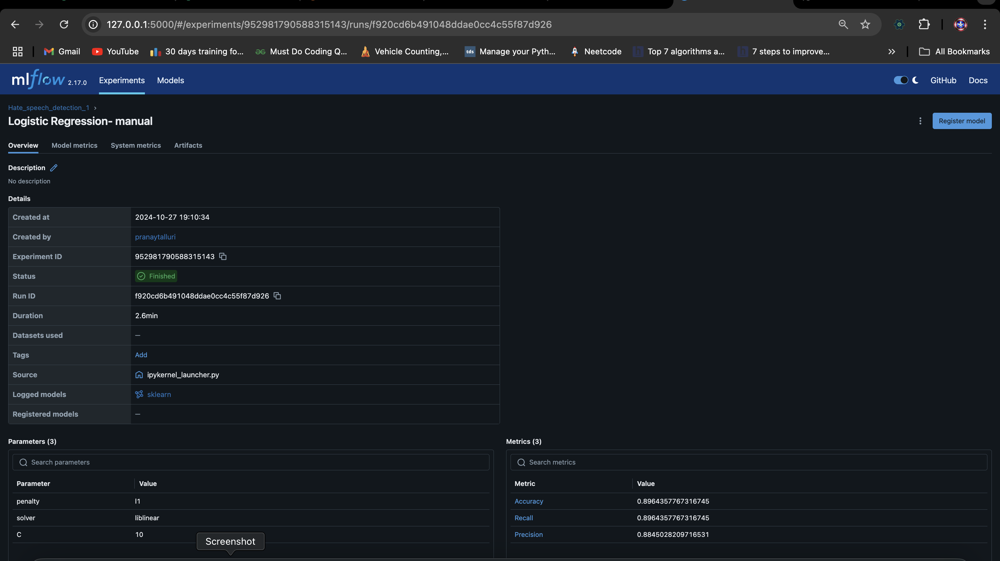

In [25]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename='/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.13.49 PM.png'))


#### Metrics
Metrics like accuracy, recall, and precision are tracked, helping evaluate model performance.

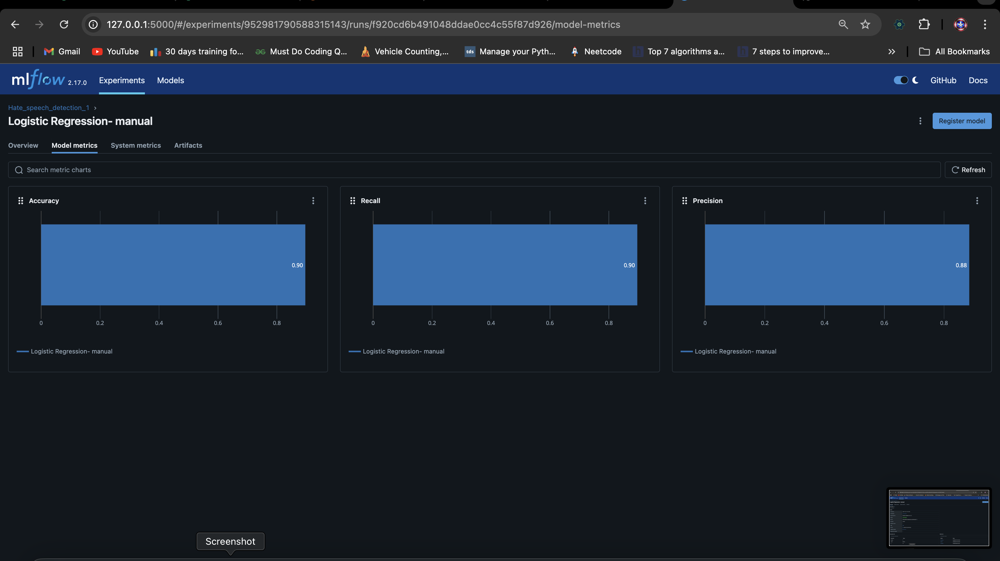

In [26]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename='/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.13.54 PM.png'))

**Logistic Regression Metrics**<br>
**Runtime**: 2.6 min <br>
**Accuracy**: 0.89 <br>
**Precision**: 0.88 <br>
**Recall**: 0.89 <br>


#### Artifacts
Artifacts logged include model files, environment files, and validation code for deployment.

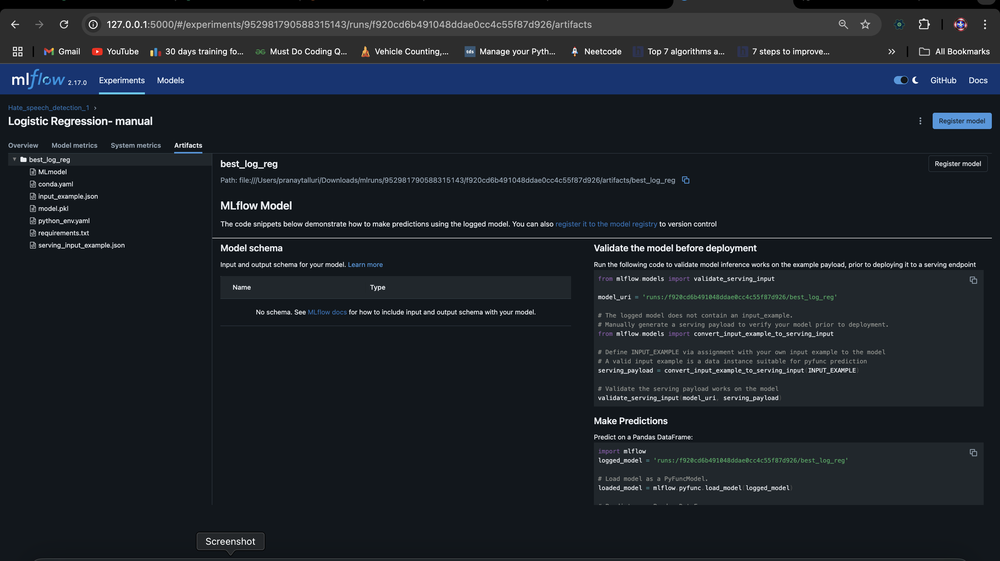

In [27]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename='/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.14.00 PM.png'))

### 4.2 KNN Experiment Tracking

#### Overview
The KNN model overview logs hyperparameters such as n_neighbors, weights, and p.










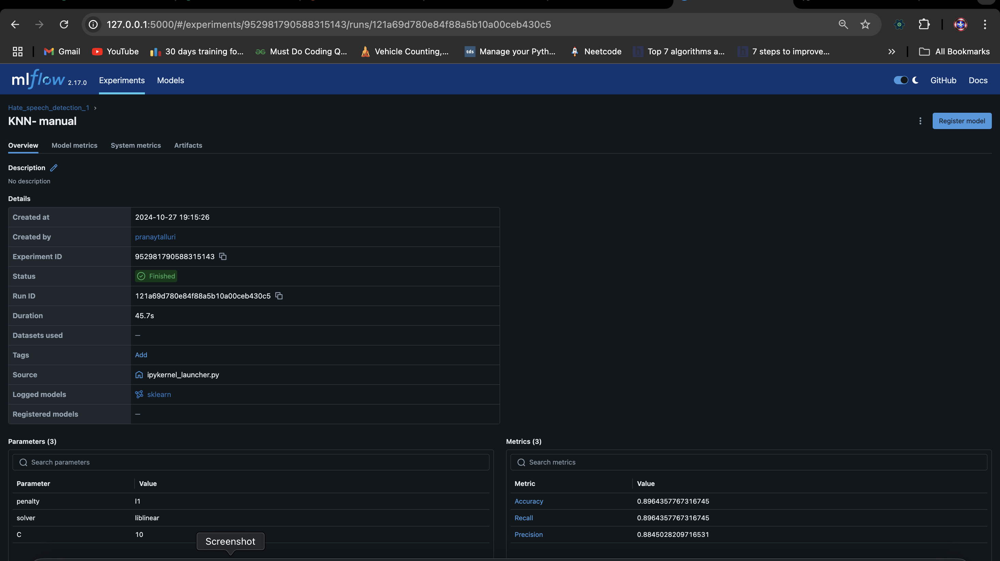

In [29]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename='/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.16.32 PM.png'))

#### Metrics
The metrics page for KNN includes accuracy, recall, and precision scores, showing model performance.

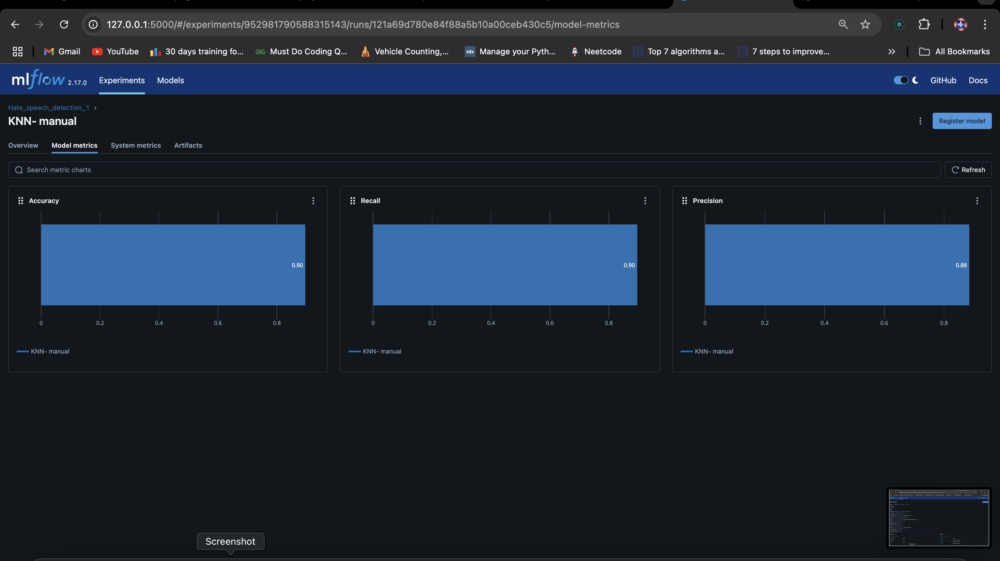

In [30]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.16.36 PM.png"))

**KNN Metrics**<br>
**Runtime**: 45.7 sec <br>
**Accuracy**: 0.89 <br>
**Precision**: 0.88 <br>
**Recall**: 0.89 <br>


#### Artifacts
The artifacts section logs KNN model files, environment files, and sample code for validation and deployment.

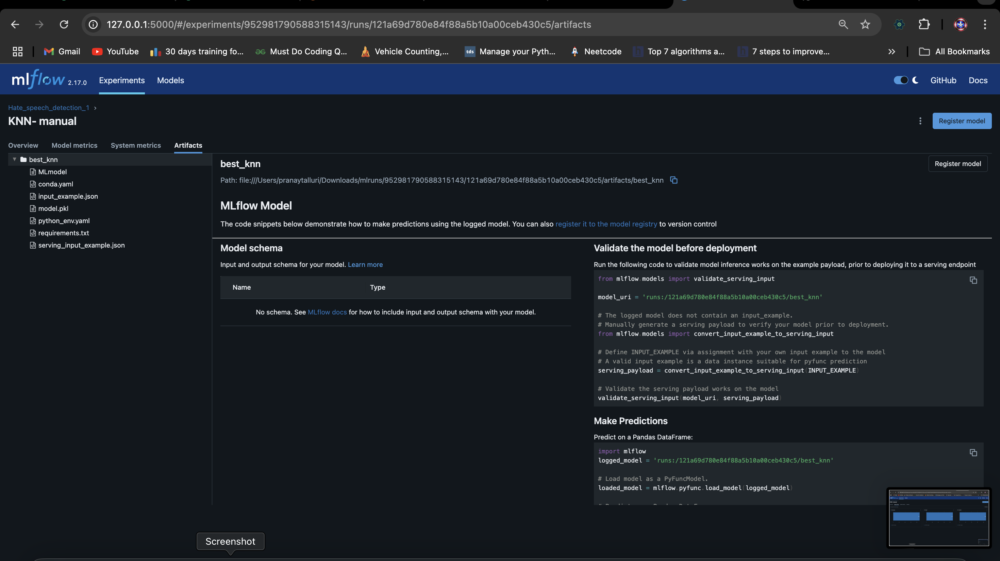

In [31]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.16.41 PM.png"))

### 4.3 SVM Experiment Tracking

#### Overview
The overview page for the SVM model shows the experiment metadata, including the Experiment ID, Run ID, and model parameters such as gamma, C, and kernel. The "Status" and "Duration" indicate the successful completion and runtime of the experiment.










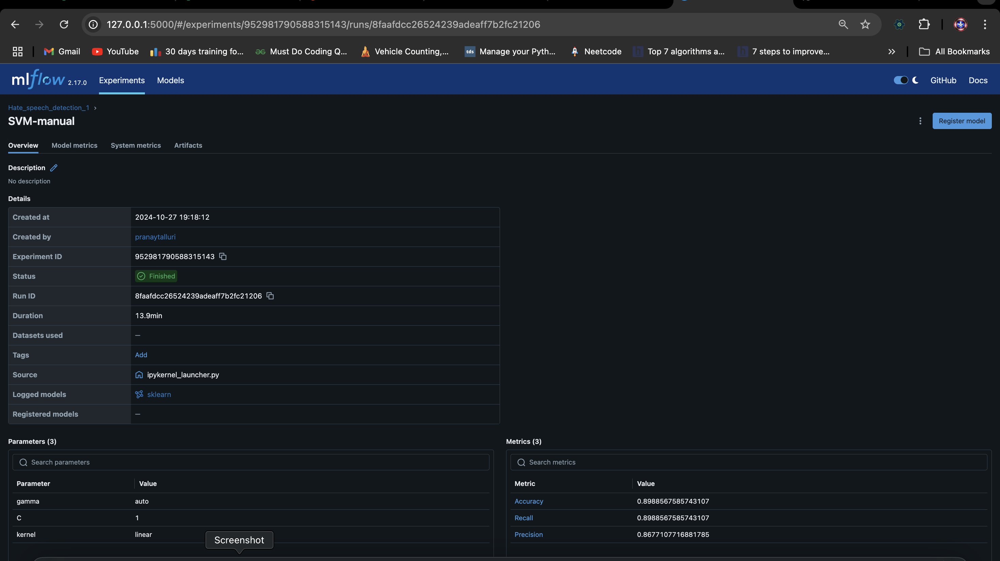

In [33]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.32.23 PM.png"))

#### Metrics
The metrics page captures the model's accuracy, recall, and precision scores. This page helps visualize and assess the model’s classification performance.


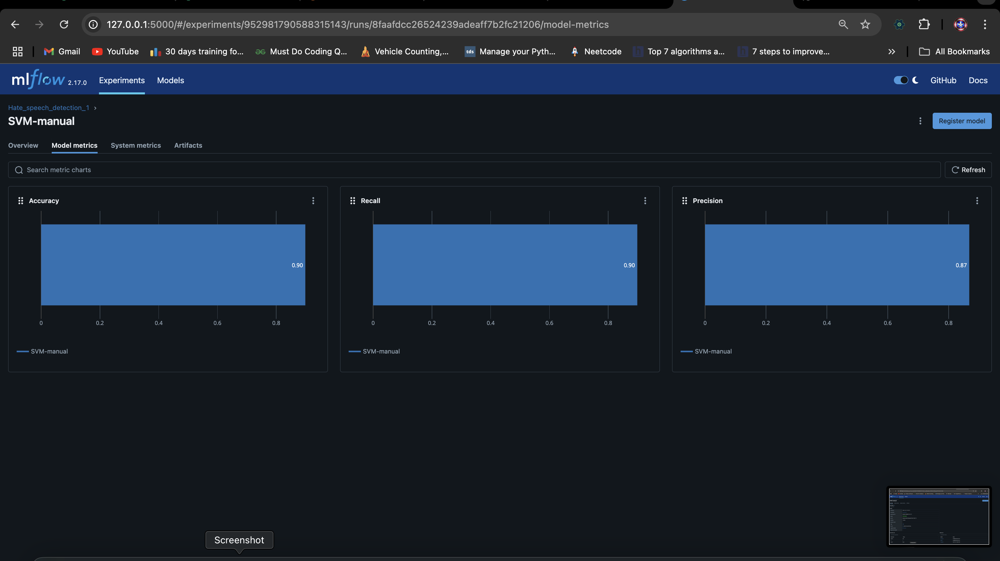

In [34]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.32.28 PM.png"))

**SVM Metrics**<br>
**Runtime**: 13.9 min <br>
**Accuracy**: 0.89 <br>
**Precision**: 0.86 <br>
**Recall**: 0.89 <br>

#### Artifacts
The artifacts page contains the logged model file, environment files, and input example data. This page also provides sample code for model validation and deployment.

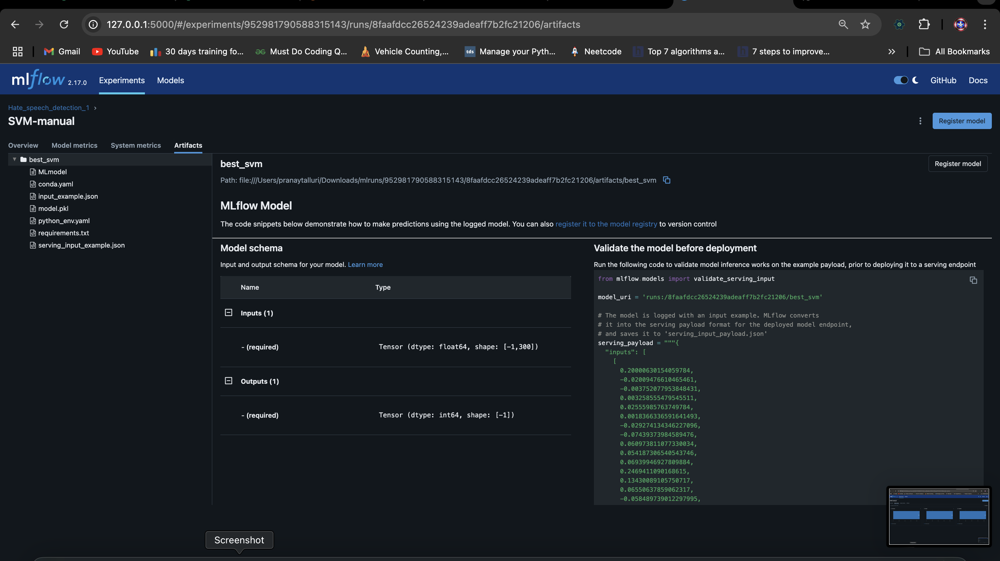

In [35]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.32.33 PM.png"))

### 4.4 Decision Tree Experiment Tracking

#### Overview
Captured parameters for DecisionTree include max_depth, min_samples_leaf, and criterion.










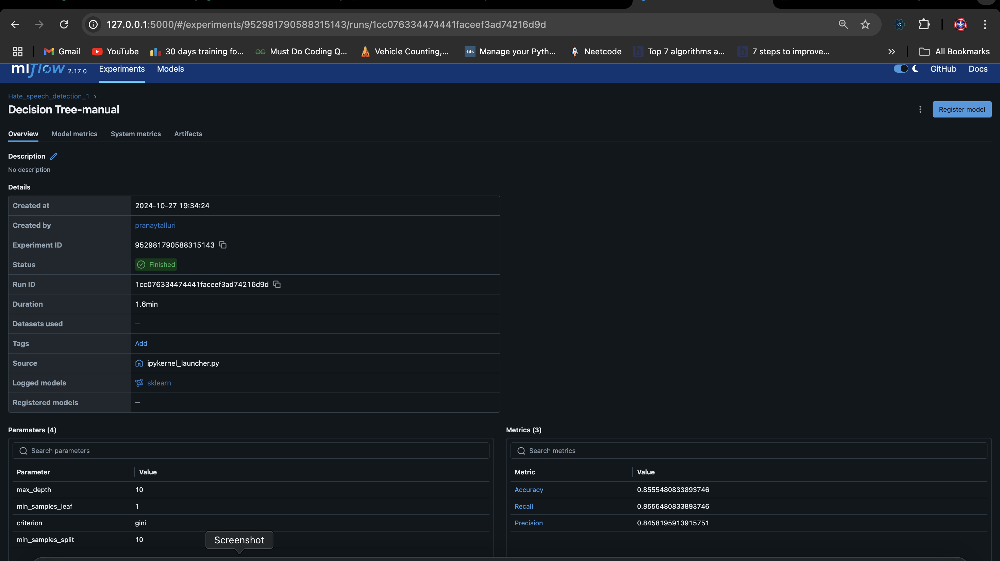

In [37]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.36.54 PM.png"))



#### Metrics
Accuracy, recall, and precision scores provide a quick summary of the model's performance.

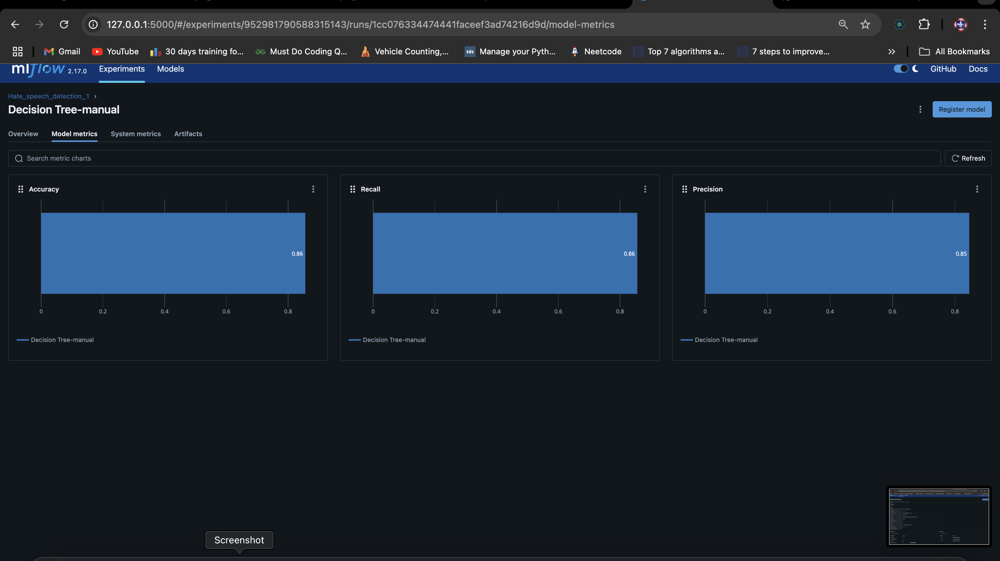

In [38]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.36.58 PM.png"))


**Decision Tree Metrics**<br>
**Runtime**: 1.6 min <br>
**Accuracy**: 0.85 <br>
**Precision**: 0.84 <br>
**Recall**: 0.85 <br>

#### Artifacts
The artifacts page holds the model and deployment files.

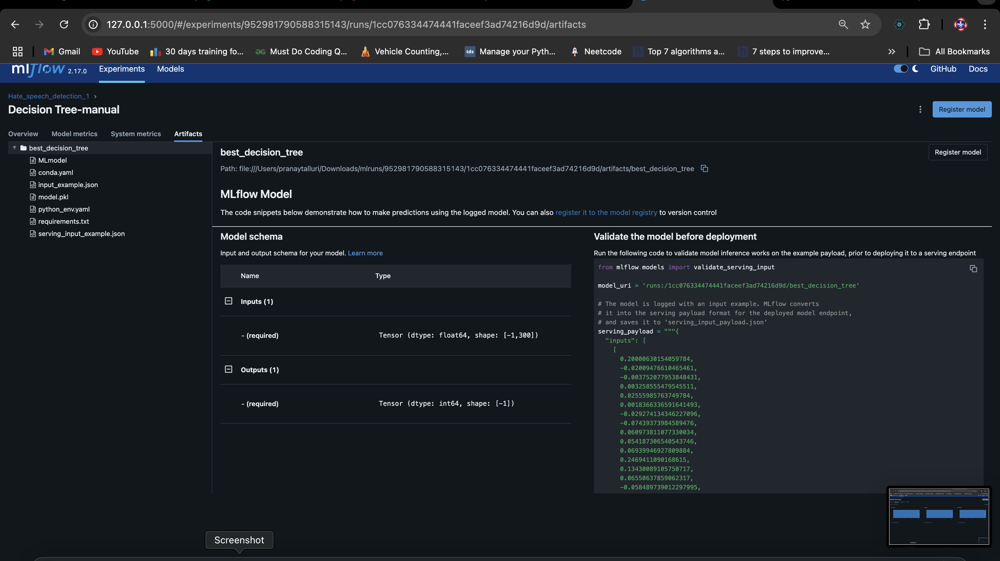

In [39]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.37.03 PM.png"))


### 4.5 RandomForest Experiment Tracking

#### Overview
The overview page details hyperparameters like max_depth, min_samples_leaf, and n_estimators for RandomForest.










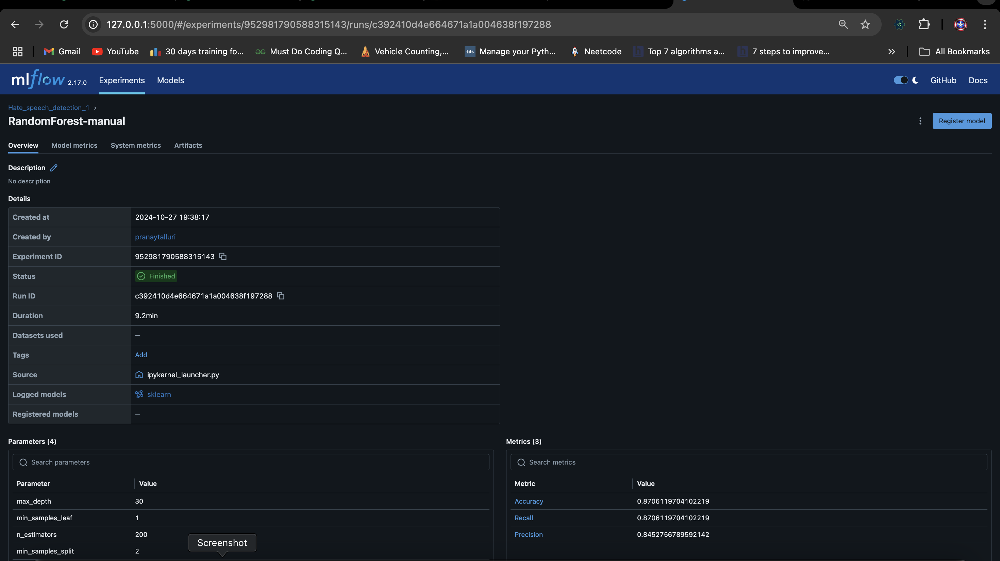

In [41]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.50.21 PM.png"))


#### Metrics
Performance metrics for RandomForest, such as accuracy, recall, and precision, are displayed.

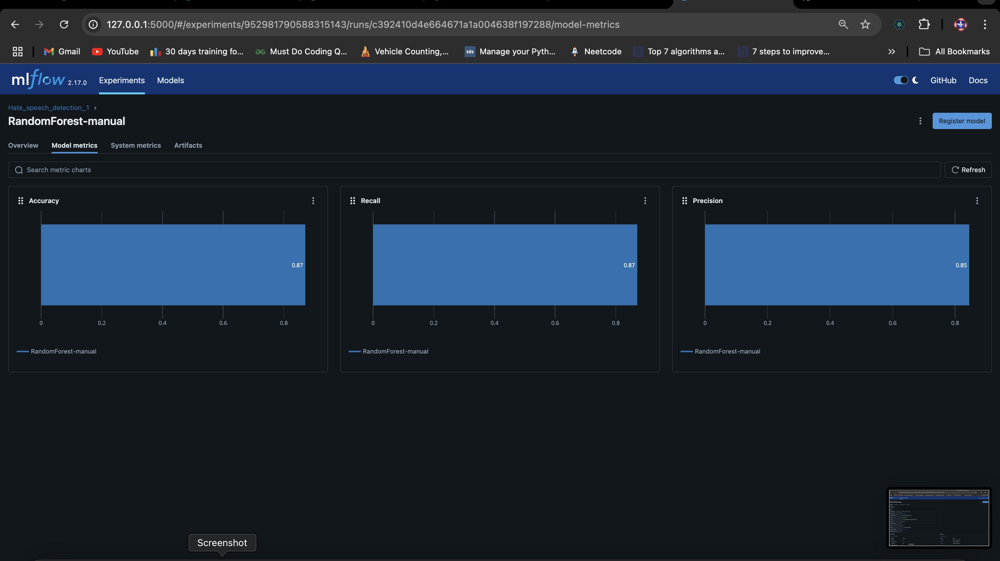

In [42]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.50.26 PM.png"))


**Random Forest Metrics**<br>
**Runtime**: 9.2 min <br>
**Accuracy**: 0.87 <br>
**Precision**: 0.84 <br>
**Recall**: 0.87 <br>


#### Artifacts
This section contains RandomForest model files, environment files, and deployment code.

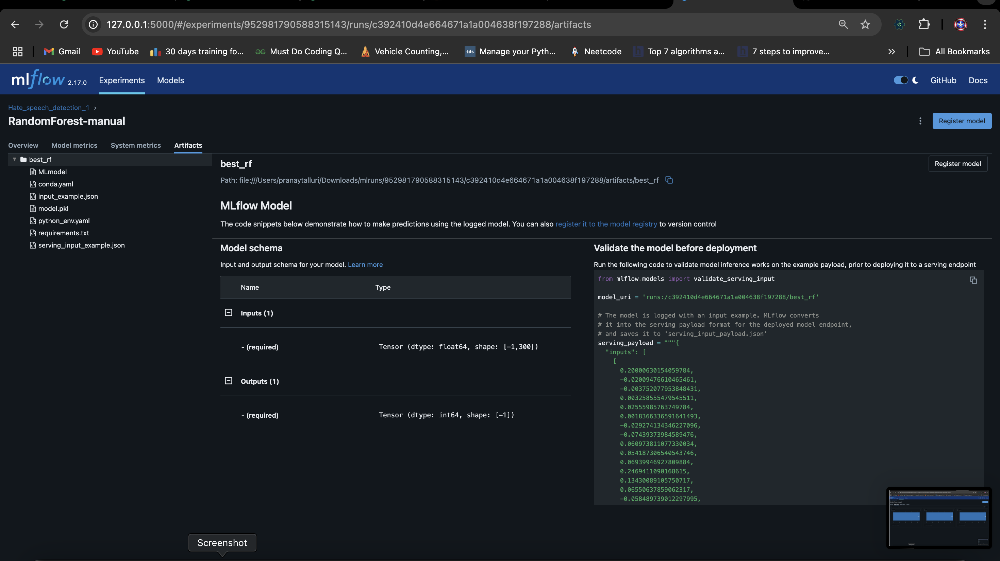

In [43]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 7.50.31 PM.png"))


### 4.6 AdaBoost Experiment Tracking

#### Overview
For AdaBoost, the overview page captures hyperparameters such as learning_rate and n_estimators.











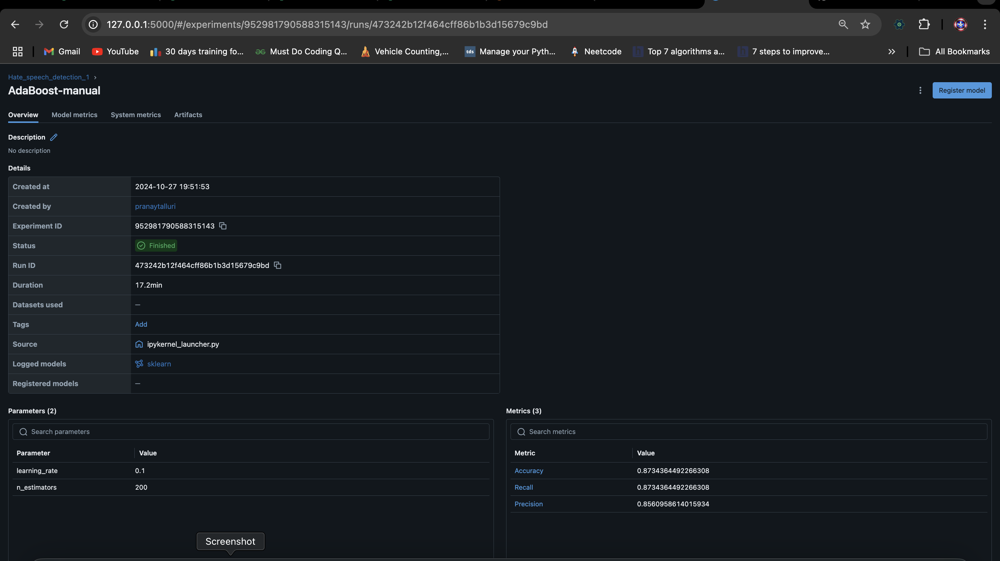

In [45]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 8.11.31 PM.png"))


#### Metrics
This page includes metrics such as accuracy, recall, and precision, allowing for performance assessment.

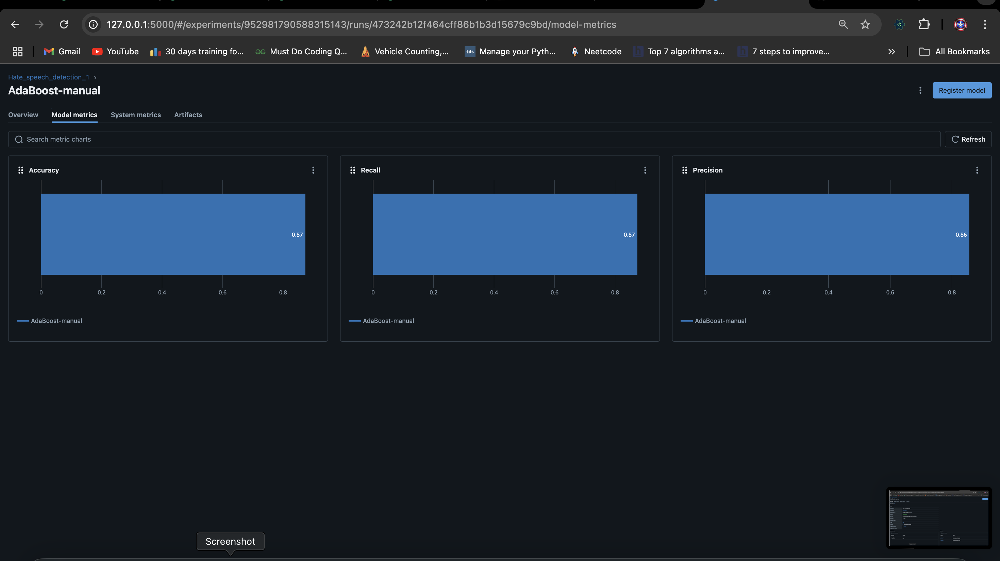

In [46]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 8.11.35 PM.png"))


**AdaBoost Metrics**<br>
**Runtime**: 17.2 min <br>
**Accuracy**: 0.87 <br>
**Precision**: 0.85 <br>
**Recall**: 0.87 <br>

#### Artifacts
Logged artifacts include the model file, which can be used for validation and deployment.

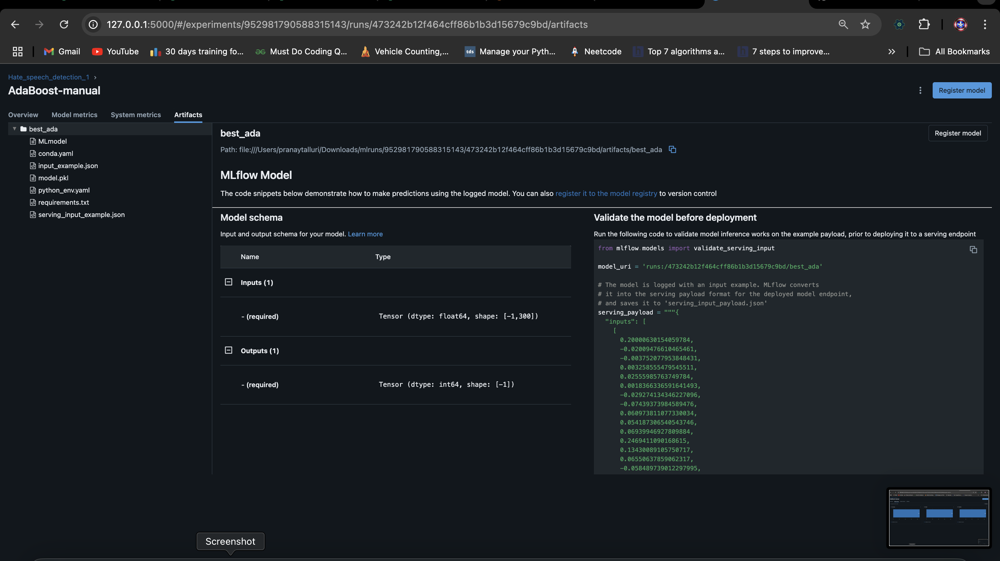

In [47]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 8.11.39 PM.png"))


### 4.7 XGBoost Experiment Tracking

#### Overview
The overview page displays the experiment details for the XGBoost model, such as the model parameters like max_depth, learning_rate, n_estimators, and subsample.











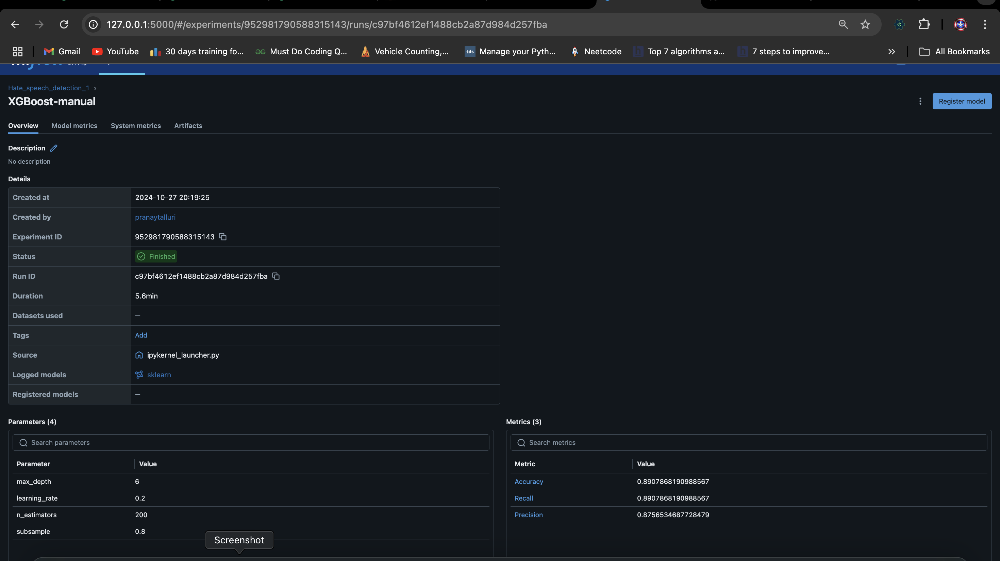

In [56]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 8.38.20 PM.png"))


#### Metrics
Here, we log the accuracy, recall, and precision values to compare the XGBoost model's performance against other models.

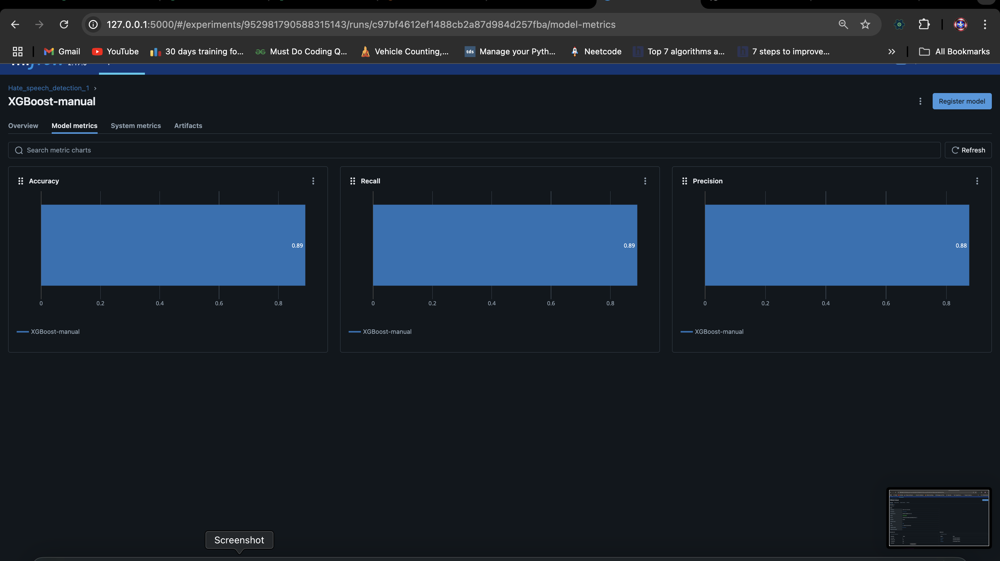

In [57]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 8.38.24 PM.png"))


**XGBoost Metrics**<br>
**Runtime**: 5.6 min <br>
**Accuracy**: 0.89 <br>
**Precision**: 0.87 <br>
**Recall**: 0.89 <br>

#### Artifacts
The artifacts page for XGBoost includes model files, configuration files, and the model schema for deployment.

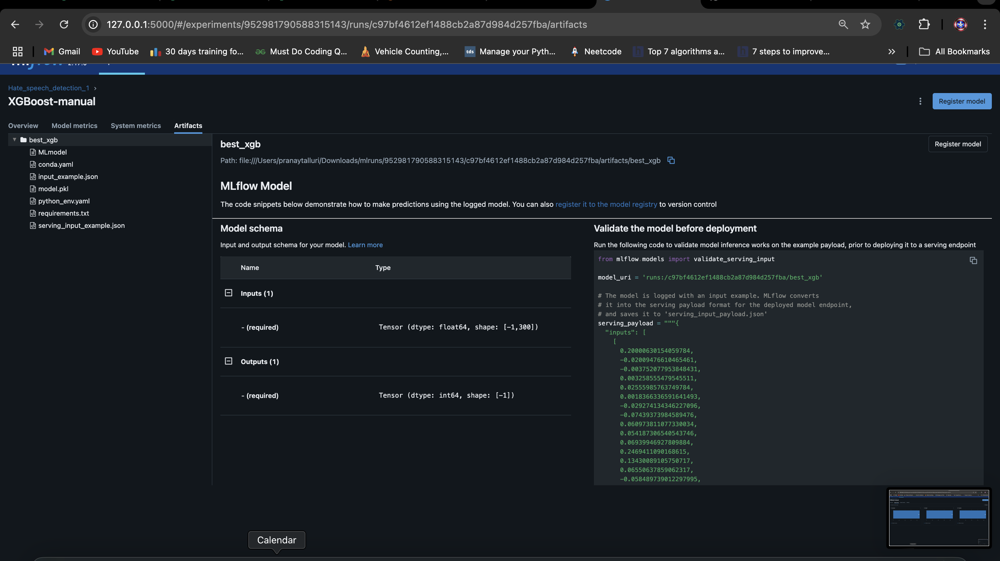

In [58]:
from IPython.display import Image, display

# Displaying an image from a file
display(Image(filename="/Users/pranaytalluri/Desktop/Screenshot 2024-10-27 at 8.38.28 PM.png"))


## 5. Model Analysis and Comparison

### 5.1 Logistic Regression
- **Performance**: Logistic Regression achieved moderate accuracy and recall. It worked well for obvious hate speech and neutral content, but its linear nature limited its ability to capture subtle differences, often misclassifying mildly offensive language as either fully offensive or neutral.
- **MLFlow Insights**: Tuning the C parameter in MLFlow logs showed slight improvements in recall for offensive language, but even with optimization, Logistic Regression was not sensitive enough for this nuanced task.

### 5.2 K-Nearest Neighbors (KNN)
- **Performance**: KNN provided moderate accuracy and had issues with contextual subtleties. It performed best on clear-cut hate speech or neutral content but struggled in cases where words had multiple interpretations.
- **MLFlow Insights**: The MLFlow logs revealed that adjusting n_neighbors improved stability slightly, but KNN’s reliance on proximity in vector space made it less reliable when class overlap or language complexity increased. This model was computationally heavy in higher neighbor values, impacting real-time performance.

### 5.3 Support Vector Machine (SVM)
- **Performance**: SVM performed well, achieving high accuracy and recall, especially in distinguishing hate speech from neutral content. The RBF kernel helped it manage non-linear relationships, making it more effective for offensive language.
- **MLFlow Insights**: MLFlow’s tracked metrics showed that tuning gamma and C parameters improved performance, capturing complex relationships in language use. However, SVM was more computationally demanding, making it less ideal for real-time content moderation.

### 5.4 Decision Tree
- **Performance**: Decision Tree performed well on the training data but overfit, leading to lower accuracy on unseen data. It was good at capturing simple patterns but struggled with the nuanced language in offensive vs. neutral cases.
- **MLFlow Insights**: Tuning parameters like max_depth slightly improved generalization, but MLFlow logs highlighted Decision Tree’s tendency to overfit. The model’s limited generalization made it less suitable for consistently distinguishing between subtle offensive and neutral cases.

### 5.5 Random Forest
- **Performance**: Random Forest was one of the strongest performers, achieving high accuracy and recall across classes. Its ensemble approach effectively reduced overfitting and provided stable predictions across hate speech, offensive, and neutral classes.
- **MLFlow Insights**: By tracking n_estimators and max_depth, MLFlow showed that Random Forest balanced precision and recall well. This model handled complex patterns in language and managed to reduce misclassification of neutral content, making it a reliable choice.

### 5.6 AdaBoost
- **Performance**: AdaBoost was effective at focusing on misclassified samples, improving its sensitivity to hate speech. However, its strong emphasis on difficult samples led it to occasionally overfit on noisy or borderline cases, reducing recall in some offensive language instances.
- **MLFlow Insights**: Tuning learning_rate and n_estimators in MLFlow revealed that AdaBoost’s higher sensitivity sometimes caused benign content to be flagged, indicating that the model may lead to some over-censorship if not carefully tuned.

### 5.7 XGBoost
- **Performance**: XGBoost emerged as the top performer, achieving the highest scores in accuracy, precision, and recall across all three categories. It was able to handle complex language patterns and capture nuanced differences between hate speech, offensive, and neutral content effectively, making it the most reliable for this task.
- **MLFlow Insights**: MLFlow tracking demonstrated that balancing learning_rate, max_depth, and subsample provided optimal performance, minimizing both overfitting and misclassification of neutral phrases. XGBoost’s regularization capabilities helped it generalize better, making it the best choice for nuanced text classification in this dataset.

### Final Model Selection and Justification
Best Model: Based on MLFlow logs and performance metrics, **XGBoost** is the best model for this problem. It showed the highest accuracy and recall, effectively balancing sensitivity to hate speech and offensive language with reduced misclassification of neutral content. This makes it ideal for real-time moderation, where precision in classification is crucial.
Although, Random Forest also performed strongly, providing balanced generalization and handling noisy content well. It’s a good alternative if computational resources for XGBoost are limited.


 ### Critical Analysis of Results

The results highlighted just how complex it is to classify text into **hate speech**, **offensive language**, and **neutral content**. Language is nuanced, and certain words can shift meaning based on context. This project required a model that could be sensitive enough to catch harmful content without being too aggressive and flagging harmless phrases.

**Key Insights**:
- **XGBoost** emerged as the best model. It handled the subtle distinctions in language well, achieving high accuracy without over-censoring. It could identify offensive or hateful language accurately while avoiding false positives on neutral content.
- **Random Forest** was also effective, offering good generalization, but XGBoost outperformed it in capturing complex language nuances.

### Potential Applications
This model has clear applications in **real-time content moderation** on social media or forums, helping flag harmful language while avoiding unnecessary censorship. It’s also useful in **automated customer support** to detect inappropriate language, ensuring interactions remain respectful. For researchers, it offers insights into language trends and the ethical implications of automated moderation.

### How MLFlow Shaped Our Conclusions
Using MLFlow to track experiments was invaluable:
- **Data-Driven Tuning**: MLFlow’s logs made it easy to see how different parameters affected performance, guiding us to fine-tune XGBoost for optimal results.
- **Easy Comparison**: Having metrics like accuracy and recall side-by-side in MLFlow helped quickly identify the strongest models.
- **Reproducibility**: MLFlow’s artifact tracking made it easy to reproduce our best model’s settings for future improvements or deployments.

**Final Takeaway**: MLFlow’s systematic tracking allowed us to confidently select and optimize XGBoost as the best solution for this project. This model is well-prepared for real-world applications in content moderation, balancing user safety and freedom of expression.